In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as cm

In [2]:
def production_rate(z):
    depth = np.array([-0.5,  0, 0.5, 7, 10, 60])
    pro   = np.array([-0.0, -0,   0, 4,  4, 0.1])
    return np.interp(z,depth,pro)

def sea_lvl(t):
    
    #sea_level_amp =          np.array([60, 20, 5, 2]).reshape(-1,1)
    sea_level_amp =          np.array([6, 1, 5, 2]).reshape(-1,1)
    sea_level_freq = 2*np.pi/np.array([600, 100, 10, 5]).reshape(-1,1)
    sea_level_phase =  np.pi*np.array([-0.6,-0.8,0,0]).reshape(-1,1)
    tt = np.array([0, 15, 18, 40, 65, 75, 80, 100, 110, 130])
    zz = np.array([0, 20,  8, 20, 75, 55, 60,  40,  55, 80])
    s_lvl = np.interp(t,tt,zz)
    
    return s_lvl +70 + np.sum(sea_level_amp*np.sin(sea_level_freq*t+sea_level_phase),axis=0)

def base(x,mound = False):
    x = x.max()-x
    
    h = np.zeros_like(x)
    
    h[x<=5] = 3.2*x[x<=5]**2
    h[(x>5)&(x<=7.8)] = 80+20/(1+np.exp(-30*(x[(x>5)&(x<=7.8)]-6)))
    h[x>7.8] = np.interp(x[x>7.8],[7.8,8],[h.max(),200])
    #h[x>7.8] = 200*x[x>7.8] - 1400
    if mound:
        h = 30/((x-4)**10 + 0.5)
        h = 60* np.exp(-((x-4)/(1))**8)
        h = 60*(1 - np.exp(-(1/np.abs(x-4+0.1j))**10) )
        h = 60*(1 - np.exp(-(1/np.abs(x-4+1j))**10) )
        
    return h

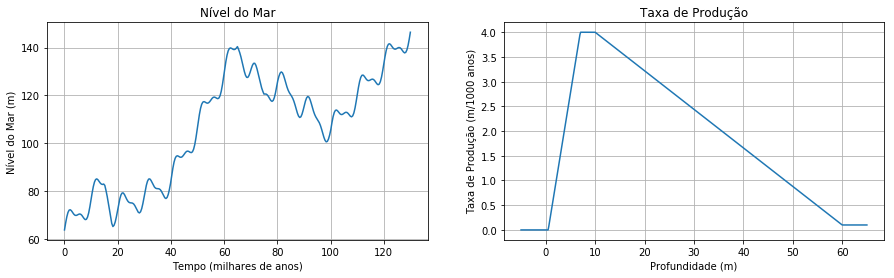

In [3]:
time = np.linspace(0,130,301)
sea_level = sea_lvl(time)

prof_end = 65
prof = np.linspace(-5,prof_end,500)
prod_rate = production_rate(prof)

plt.figure(figsize=(15,4))
plt.subplot(1,2,1)
plt.plot(time,sea_level)
plt.title('Nível do Mar')
plt.xlabel('Tempo (milhares de anos)')
plt.ylabel('Nível do Mar (m)',)
plt.grid()

plt.subplot(1,2,2)
plt.plot(prof,prod_rate)
plt.title('Taxa de Produção')
plt.xlabel('Profundidade (m)')
plt.ylabel('Taxa de Produção (m/1000 anos)',)
plt.grid()
plt.show()

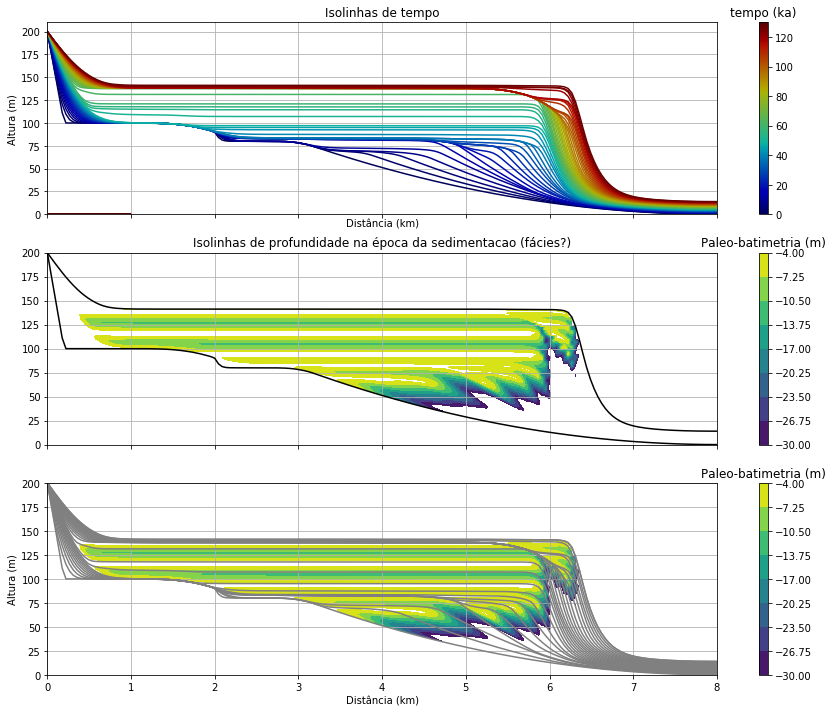

In [4]:
import numpy.matlib 
t_end=130
nt = 2001
t = np.linspace(0,t_end,nt)
dt = t_end/(nt-1)
nx = 181
x = np.linspace(0,8,nx)
dx = 8/(nx-1)

z = np.zeros((nt,nx))

mound = False
z[0] = base(x,mound)

bck = slice(0,  -2, None)
ctr = slice(1,  -1, None)
fwd = slice(2,None, None)

d2zdx2 = np.zeros_like(x)
a = 1e-3*1 # Difusividade para erosao

nprof = 500
prof = np.linspace(0,200,nprof)
fac = np.full((nprof,nx),np.nan)
embasamento = prof[:,None] > z[0][None,:]
fac[embasamento] = np.nan

for ind in range(nt-1):
    tnow = t[ind]
    znow = z[ind]

    d2zdx2[ctr] = (znow[bck] - 2*znow[ctr] + znow[fwd])/dx**2
    Ldagua = sea_lvl(tnow) - znow
    
    dzdt = production_rate(Ldagua) + a*d2zdx2
    
    z[ind+1] = znow + dzdt*dt
    #z[ind+1,0]  = z[ind+1,2] # Condicao de contorno
    z[ind+1,-1]  = z[ind+1,-3] # Condicao de contorno
    #zrep = np.matlib.repmat(z[ind+1],nprof,1)
    ar = prof[:,None] > z[ind+1][None,:]
    fac[ar] = np.nan
    novo = (prof[:,None] > znow[None,:]) & ~ar
        
    Ldagua_rep = np.matlib.repmat(prof[:,None] - sea_lvl(tnow),1,nx)
    fac[novo] = Ldagua_rep[novo]

plotstep = 40
zplot = z[::plotstep].copy()
nplots = zplot.shape[0]
for ind in range(1,nplots):
        zchange = zplot[:ind]
        erosao = zchange > zplot[ind,:]
        znow = np.matlib.repmat(zplot[ind],ind,1)
        zchange[erosao] = znow[erosao]

import matplotlib
def cmap_map(function, cmap):
    """ Applies function (which should operate on vectors of shape 3: [r, g, b]), on colormap cmap.
    This routine will break any discontinuous points in a colormap.
    """
    cdict = cmap._segmentdata
    step_dict = {}
    # Firt get the list of points where the segments start or end
    for key in ('red', 'green', 'blue'):
        step_dict[key] = list(map(lambda x: x[0], cdict[key]))
    step_list = sum(step_dict.values(), [])
    step_list = np.array(list(set(step_list)))
    # Then compute the LUT, and apply the function to the LUT
    reduced_cmap = lambda step : np.array(cmap(step)[0:3])
    old_LUT = np.array(list(map(reduced_cmap, step_list)))
    new_LUT = np.array(list(map(function, old_LUT)))
    # Now try to make a minimal segment definition of the new LUT
    cdict = {}
    for i, key in enumerate(['red','green','blue']):
        this_cdict = {}
        for j, step in enumerate(step_list):
            if step in step_dict[key]:
                this_cdict[step] = new_LUT[j, i]
            elif new_LUT[j,i] != old_LUT[j, i]:
                this_cdict[step] = new_LUT[j, i]
        colorvector = list(map(lambda x: x + (x[1], ), this_cdict.items()))
        colorvector.sort()
        cdict[key] = colorvector

    return matplotlib.colors.LinearSegmentedColormap('colormap',cdict,1024)        

if True:
    cyc = 1
    vmax = nplots/cyc
    norm = mpl.colors.Normalize(vmin=0, vmax=vmax,clip=True)
    cmap = cmap_map(lambda x: x*0.7, cm.jet)
    m = cm.ScalarMappable(norm=norm, cmap=cmap)

    fig,(ax0,ax1,ax2) = plt.subplots(3,1,sharex=True,figsize=(15,12))

    cs = ax0.pcolor([0,1],np.linspace(0,1,nt),np.column_stack((t,t)),cmap=cmap)  
    clb = plt.colorbar(cs,ax=ax0)
    clb.ax.set_title('tempo (ka)')
    for ind in range(0,nplots):
        ax0.plot(x,zplot[ind],color=m.to_rgba(ind%vmax))

    ax0.set_title('Isolinhas de tempo')
    ax0.set_xlabel('Distância (km)')
    ax0.set_ylabel('Altura (m)')
    ax0.grid()


    #plt.figure(figsize=(15,5))
    ax1.plot(x,z[-1],'k')
    ax1.plot(x,zplot[0],'k')
    cs = ax1.contourf(x,prof,fac,np.linspace(-30,-4,9))
    clb = plt.colorbar(cs,ax=ax1)
    clb.ax.set_title('Paleo-batimetria (m)')
    ax1.set_title('Isolinhas de profundidade na época da sedimentacao (fácies?)')
    ax1.grid()

    cs = ax2.contourf(x,prof,fac,np.linspace(-30,-4,9),alpha=1)
    clb = plt.colorbar(cs,ax=ax2)
    clb.ax.set_title('Paleo-batimetria (m)')

    for ind in range(0,nplots,2):
        ax2.plot(x,zplot[ind],'gray')#,color=m.to_rgba(ind%vmax))
    ax2.plot(x,zplot[-1],'gray')    
    ax2.set_xlabel('Distância (km)')
    ax2.set_ylabel('Altura (m)')
    ax2.grid()    

    plt.show()

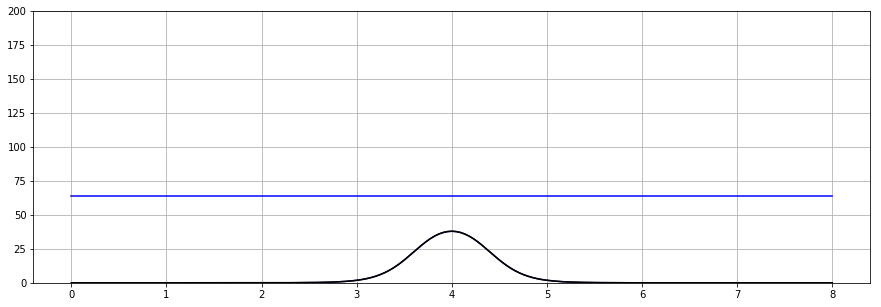

In [62]:
from IPython.display import HTML
from matplotlib import animation

mult = 2
movie_step = int(plotstep/mult)
zzmovie = z[::movie_step].copy()
zzlayer = z[::plotstep].copy()

nframes = zzmovie.shape[0]

fig = plt.figure(figsize=(15,5))

def plt_movie(n):
    NM = sea_lvl(dt*movie_step*n)
    x_sea = x[zzmovie[n]<NM]
    NM = NM*np.ones_like(x_sea)
    nmaxlayer = int(n/mult)+1
    for ind in range(1,nmaxlayer):
        zchange = zzlayer[:ind]
        erosao = zchange > zzmovie[ind*mult,:]
        znow = np.matlib.repmat(zzmovie[ind*mult],ind,1)
        zchange[erosao] = znow[erosao]
        if ind==nmaxlayer-1:
            erosao = zchange > zzmovie[n,:]
            znow = np.matlib.repmat(zzmovie[n],ind,1)
            zchange[erosao] = znow[erosao]
            
    plt.clf()
    for ind in range(nmaxlayer):
        plt.plot(x,zzlayer[ind],color=m.to_rgba(ind%vmax))
    
    plt.plot(x,zzmovie[n],'k')
    plt.plot(x_sea,NM,'b')
    plt.ylim(0,200)
    plt.grid()
    
anim = animation.FuncAnimation(fig, plt_movie, frames=nframes-1, interval=50)

HTML(anim.to_jshtml())